### Lab 2 Overview
#### First Half
- Visualisations with Python
    - Map Clusters
    - Heatmaps
    - HexBins (vs SquareBins)
    - Choropleths

#### Second Half
- *Questions?*
- *Review more Python code?*
- *Industry techniques and basic procedures?*

### Visualisations
- Clustering points
- Binned plots
- Good visualizations vs Bad visualizastions


#### My Personal Checklist:
1. Your visualisation needs to tell a story
2. It should be intepretable without being overly verbose
3. The scale and axis need to make sense (and you can assume the reader knows the difference between a normal scale vs log scale)
4. The choice of visualisation needs to make sense:
    - Line plot vs Bar chart with non-numerical categories
    - Map plot with points vs clusters for each location
    - Scatterplot vs Histogram plot to see distribution
    - etc
5. Choice of colours need to be easy on the eyes

In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [2]:
# read in the data
df = pd.read_feather("../Data/Lab1/sample.feather").drop('index', axis=1)

# if you require another method to read in feather
# import feather
# df = feather.read_dataframe("../Data/Lab1/sample.feather").drop('index', axis=1)

df.tail()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,...,tip_amount,tolls_amount,improvement_surcharge,total_amount,PickupCell,DropoffCell,pickupX,pickupY,dropoffX,dropoffY
98190,2,4/12/15 22:55,4/12/15 23:03,1,0.75,-73.994370,40.746239,1,N,-73.980774,...,0.00,0.0,0.3,7.80,25:69,27:68,-8.237016e+06,4.974984e+06,-8.235502e+06,4.974382e+06
98191,1,4/12/15 22:55,4/12/15 23:08,1,2.40,-73.968346,40.759735,1,N,-73.969879,...,0.00,0.0,0.3,12.30,27:64,24:60,-8.234119e+06,4.976967e+06,-8.234289e+06,4.980647e+06
98192,1,4/12/15 22:55,4/12/15 23:01,1,0.80,-73.993484,40.742168,1,N,-73.984390,...,1.45,0.0,0.3,8.75,25:69,26:67,-8.236917e+06,4.974386e+06,-8.235905e+06,4.975537e+06
98193,2,4/12/15 22:55,4/12/15 23:17,1,4.73,-73.984993,40.747929,1,N,-73.981552,...,3.96,0.0,0.3,23.76,26:68,33:76,-8.235972e+06,4.975232e+06,-8.235589e+06,4.966693e+06
98194,2,4/12/15 22:55,4/12/15 22:59,2,0.80,-73.975731,40.751968,1,N,-73.981247,...,1.16,0.0,0.3,6.96,27:66,27:68,-8.234941e+06,4.975826e+06,-8.235555e+06,4.974377e+06


### Clustering

In [3]:
import folium
from folium.plugins import FastMarkerCluster

# lat, long
COORDS = ['pickup_latitude', 'pickup_longitude']

# create an interactive geospatial graph
nycM = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)

# use a built-in clustering algorithm to apply markers for hotspots
FastMarkerCluster(data=df[COORDS].values).add_to(nycM)

# visualize the plot 
nycM.save('../plots/foliumFastCluster.html')
nycM

- Compared to last weeks' visualisation, it is much easier to see the distribution
- Zoom in for specific zones/areas
- We now have numerical values to put to areas (compared to a plethora of points)
- Is this useful as a plot?

### Heatmaps

Heatmap of pickup locations

In [4]:
from folium.plugins import HeatMap

nycM2 = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)
nycM2.add_child(HeatMap(df[COORDS].values, radius=10))

nycM2.save('../plots/foliumPickupHeatmap.html')
nycM2

Heatmap of dropoff locations

In [5]:
nycM3 = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)
nycM3.add_child(HeatMap(df[['dropoff_latitude', 'dropoff_longitude']].values, radius=10))

nycM3.save('../plots/foliumDropoffHeatmap.html')
nycM3

### Hex Binned Plots

In [6]:
from bokeh.plotting import figure, show
from bokeh.io import save

# tile providers are the underlying map 
from bokeh.tile_providers import get_provider, Vendors
TILE = get_provider("STAMEN_TERRAIN_RETINA")

# to display bokeh plots inside jupyter, we need to use output_notebook
from bokeh.io import reset_output, output_notebook
reset_output()
output_notebook()
# note below that it says "BokehJS 1.4.0 successfully loaded."

Loading BokehJS ...

In [7]:
df.dropna(inplace=True)

# create left and right boundaries for the x and y axis respectively
xRange = [df['pickup_longitude'].min(), df['pickup_longitude'].max()]
yRange = [df['pickup_latitude'].min(), df['pickup_latitude'].max()]

def lat2mercer(coords):
    k = 6378137
    converted = list()
    for lat in coords:
        converted.append(np.log(np.tan((90 + lat) * np.pi/360.0)) * k)
    return converted

def lon2mercer(coords):
    k = 6378137
    converted = list()
    for lon in coords:
        converted.append(lon * (k * np.pi/180.0))
    return converted

# convert to mercer
df['pickupX'] = df['pickup_longitude'].apply(lambda x: lon2mercer([x])[0])
df['pickupY'] = df['pickup_latitude'].apply(lambda x: lat2mercer([x])[0])

In [8]:
# create bokeh figure, where x_range and y_range are in mercer
p = figure(x_range=lon2mercer(xRange), y_range=lat2mercer(yRange),
           x_axis_type="mercator", y_axis_type="mercator")
# add map tile
p.add_tile(TILE)
# change title
p.title.text = "Hex-Binned Pickups in NYC"

# add hexbin (size param is the bin size - more about it next week)
p.hexbin(x=df['pickupX'], y=df['pickupY'], size=250)

show(p)
save(p, '../plots/bokehPickupHexBinned.html')

'C:\\Users\\Akira Wang\\Documents\\GitHub\\MAST30034Repo\\plots\\bokehPickupHexBinned.html'

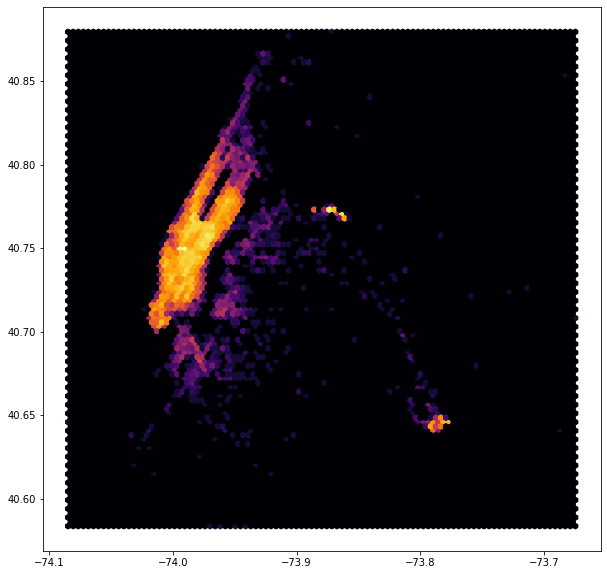

In [9]:
import matplotlib.pyplot as plt

test = df.dropna()
plt.figure(figsize=(10,10))

plt.hexbin(x = test[COORDS[1]], y= test[COORDS[0]],
           gridsize=100, bins='log', cmap='inferno')

plt.show()

### Using shapefile overlays
**NOTE THAT THIS ONLY APPLIES ON THE MORE RECENT DATASETS**

Shapefile Links:
- https://s3.amazonaws.com/nyc-tlc/misc/taxi_zones.zip
- https://s3.amazonaws.com/nyc-tlc/misc/taxi+_zone_lookup.csv

Installation:
- Requires `geopandas` to work with efficiently. If `conda install geopandas` doesn't work, you'll need to do a work around. I've done the best I can to have a generalised installation, though it may require work from your side too

Manual:
1. Visit https://www.lfd.uci.edu/~gohlke/pythonlibs/
2. You will need 2 different `.whl` (wheel) files. These are `GDAL` and `Fiona`.
3. Find both of them and download the version **corresponding to your device OS and Python**. For example, a 64-bit Windows 10 device running Python 3.7.X will need to download this file for `GDAL`. Repeat this for `Fiona` as well. (For your convenience, a fresh installation of Anaconda will yield Python 3.7.3, and most modern devices all run on 64-bit architecture. I have provided these in the `geopandas_dependencies` folder)
![gdal](./cloud/gdal.PNG)
4. Once they are downloaded, you will need to open up command prompt and `cd` into the directory. For example, if my `.whl` files are in the `geopandas_dependencies` folder, the command I would use is:
    - `cd C:\Users\USERNAME\Documents\GitHub\MAST30034Repo\workbook\geopandas_dependencies`
5. Install the dependencies in this order:
    - `pip install GDAL-3.1.2-cp37-cp37m-win_amd64.whl` (or the corresponding file you downloaded)
    - `pip install Fiona-1.8.13-cp37-cp37m-win_amd64.whl`
6. Run `pip install geopandas` and it should now work

In [10]:
df = pd.read_csv("../Data/Lab2/yellow_tripdata_2019-01.csv")

In [11]:
import geopandas as gpd

# sf stands for shape file
sf = gpd.read_file("../Data/taxi_zones/taxi_zones.shp")
zone = pd.read_csv("../Data/taxi_zones/taxi+_zone_lookup.csv")

# Convert geometry to long/lat 
sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

In [12]:
# gdf stands for geo data frame
# here, we are creating a GeoDataFrame with our df data and shapefile data. 
# from df, we are joining on PULocationID, from sf we are joining on LocationID
# we then drop PULocationID as we do not need duplicates
gdf = gpd.GeoDataFrame(pd.merge(df, sf, left_on='PULocationID', right_on='LocationID')).drop('PULocationID',axis=1)
gdf.head(1)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,DOLocationID,payment_type,fare_amount,...,improvement_surcharge,total_amount,congestion_surcharge,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,2,2019-01-05 06:28:07,2019-01-05 06:56:29,2,10.59,1,N,198,2,31.0,...,0.3,31.8,NaN,132,0.245479,0.002038,JFK Airport,132,Queens,"MULTIPOLYGON (((-73.82503 40.66358, -73.82486 ..."


Now, lets try plot this with `folium`. There are two ways to approach this kind of task:
- Plot all the data!
- Aggregate *before* plotting data!

It's up to you to decide which to use...

In [13]:
# folium requires a geo JSON format for the geo_data arg, read more about it from the documentations
geoJSON = gdf[['LocationID','geometry']].drop_duplicates('LocationID').to_json()

This plot is just shapefiles based on the locations and **does not** show any analysis.

Use this as a reference on how you can plot shapefiles...

In [14]:
m = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on how to plot aggregated data.
folium.Choropleth(
    geo_data=geoJSON,
    name='choropleth',
).add_to(m)

m.save('../plots/foliumChoroplethMap.html')
m